In [9]:
import numpy as np
from collections import defaultdict

class Agent:

    def __init__(self, nA=6):
        """ Initialize agent.

        Params
        ======
        - nA: number of actions available to the agent
        """
        self.nA = nA
        self.Q = defaultdict(lambda: np.zeros(self.nA))
       
        self.constantAlpha = 0.25
        self.gamma = 1.0
        
    def get_action_probs(self, state, e=0.0):
        """ obtains the action probabilities corresponding to epsilon-greedy policy
        
        Params
        ======
        - state: the current state of the environment
        - e: Threshold for exploitation (0) vs exploration(1).

        Returns
        =======
        - policy_s: The Action to take in the current State.
        """
    
        policy_s = np.ones(self.nA) * e / self.nA
        best_a = np.argmax(self.Q[state])
        policy_s[best_a] = 1 - e + (e / self.nA)
        return policy_s
        
    def select_action(self, state, i_episode):
        """ Given the state, select an action.

        Params
        ======
        - state: the current state of the environment

        Returns
        =======
        - action: an integer, compatible with the task's action space
        """
        if state not in self.Q:
            return np.random.choice(self.nA)
        return np.random.choice(np.arange(self.nA), p=self.get_action_probs(state, 1/i_episode))

    def step(self, state, next_action, next_reward, next_state, done):
        """ Update the agent's knowledge, using the most recently sampled tuple.

        Params
        ======
        - state: the previous state of the environment
        - action: the agent's previous choice of action
        - reward: last reward received
        - next_state: the current state of the environment
        - done: whether the episode is complete (True or False)
        """
        
        # SARSA
        prev_estimate = self.Q[state][next_action]
        if (done):
            next_estimate = 0
        else:
            #SARSA
            #next_estimate = self.Q[next_state][next_action]
            # EXPECTED SARSA
            policy_s = self.get_action_probs(state)
            next_estimate = np.dot(self.Q[next_state], policy_s)
            
        # TD Target
        tdTarget = next_reward + self.gamma * next_estimate
        # Set the action value function for the current state and next action.
        self.Q[state][next_action] = prev_estimate + self.constantAlpha * (tdTarget - prev_estimate)

In [29]:
from collections import deque
import sys
import math
import numpy as np

R2 = []
E2 = []

def interact(env, agent, num_episodes=3000, window=100):
    """ Monitor agent's performance.
    
    Params
    ======
    - env: instance of OpenAI Gym's Taxi-v1 environment
    - agent: instance of class Agent (see Agent.py for details)
    - num_episodes: number of episodes of agent-environment interaction
    - window: number of episodes to consider when calculating average rewards

    Returns
    =======
    - avg_rewards: deque containing average rewards
    - best_avg_reward: largest value in the avg_rewards deque
    """
    # initialize average rewards
    avg_rewards = deque(maxlen=num_episodes)
    # initialize best average reward
    best_avg_reward = -math.inf
    # initialize monitor for most recent rewards
    samp_rewards = deque(maxlen=window)
    # for each episode
    for i_episode in range(1, num_episodes+1):
        E2.append(i_episode)
        # begin the episode
        state = env.reset()
        # initialize the sampled reward
        samp_reward = 0
        while True:
            # agent selects an action
            action = agent.select_action(state, i_episode)
            # agent performs the selected action
            next_state, reward, done, _ = env.step(action)
            # agent performs internal updates based on sampled experience
            agent.step(state, action, reward, next_state, done)
            # update the sampled reward
            samp_reward += reward
        
            # update the state (s <- s') to next time step
            state = next_state
            if done:
                # save final sampled reward
                samp_rewards.append(samp_reward)
                R2.append(samp_reward)
                break
        if (i_episode >= 100):
            # get average reward from last 100 episodes
            avg_reward = np.mean(samp_rewards)
            # append to deque
            avg_rewards.append(avg_reward)
            # update best average reward
            if avg_reward > best_avg_reward:
                best_avg_reward = avg_reward
        # monitor progress
        print("\rEpisode {}/{} || Best average reward {}".format(i_episode, num_episodes, best_avg_reward), end="")
        sys.stdout.flush()
        # check if task is solved (according to OpenAI Gym)
        if best_avg_reward >= 9.7:
            print('\nEnvironment solved in {} episodes.'.format(i_episode), end="")
            break
        if i_episode == num_episodes: print('\n')
    return avg_rewards, best_avg_reward

In [30]:
import gym
import numpy as np

env = gym.make('Taxi-v3')
agent = Agent()
avg_rewards, best_avg_reward = interact(env, agent)

Episode 3000/3000 || Best average reward 7.3752



In [32]:
# Number of possible actions
action_size = env.action_space.n 
print("Action size ", action_size) 

# Number of possible states
state_size = env.observation_space.n 
print("State size ", state_size)
qtable = np.zeros((state_size, action_size))
print(qtable)

episodes = 3000          # Total episodes
max_steps = 100            # Max steps per episode
lr = 0.3                    # Learning rate
decay_fac = 0.00001         # Decay learning rate each iteration
gamma = 0.90                # Discounting rate - later rewards impact less
R1 = []
E1 = []


for episode in range(episodes):
    
    state = env.reset() # Reset the environment
    done = False        # Are we done with the environment
    lr -= decay_fac     # Decaying learning rate
    step = 0
    Sum = 0
   
    
    if lr <= 0: # Nothing more to learn?
        break
        
    for step in range(max_steps):
        
        # Randomly Choose an Action
        action = env.action_space.sample()
        
        # Take the action -> observe new state and reward
        new_state, reward, done, info = env.step(action)
        Sum += reward
        
        # Update qtable values
        if done == True: # If last, do not count future accumulated reward
            qtable[state, action] = qtable[state, action]+lr*(reward+gamma*0-qtable[state,action])
            break
        else: # Consider accumulated reward of best decision stream
            qtable[state, action] = qtable[state,action]+lr*(reward+gamma*np.max(qtable[new_state,:])-qtable[state,action])
            
        # moving states
        state = new_state
    
    print("The sum of rewards is {}".format(Sum))
    print("for episode {}".format(episode))
    episode
    R1.append(Sum)
    E1.append(episode)
    episode += 1
    print(R1)
    
    if (episode % 3000 == 0):
        print('episode = ', episode)
        print('learning rate = ', lr)
        print('-----------')
        


Action size  6
State size  500
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
The sum of rewards is -352
for episode 0
[-352]
The sum of rewards is -415
for episode 1
[-352, -415]
The sum of rewards is -469
for episode 2
[-352, -415, -469]
The sum of rewards is -361
for episode 3
[-352, -415, -469, -361]
The sum of rewards is -433
for episode 4
[-352, -415, -469, -361, -433]
The sum of rewards is -469
for episode 5
[-352, -415, -469, -361, -433, -469]
The sum of rewards is -406
for episode 6
[-352, -415, -469, -361, -433, -469, -406]
The sum of rewards is -415
for episode 7
[-352, -415, -469, -361, -433, -469, -406, -415]
The sum of rewards is -460
for episode 8
[-352, -415, -469, -361, -433, -469, -406, -415, -460]
The sum of rewards is -334
for episode 9
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334]
The sum of rewards is -334
for episode 10
[-352, -415, -469, -361, -433, -469, -406, -4

The sum of rewards is -397
for episode 46
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397]
The sum of rewards is -415
for episode 47
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415]
The sum of rewards is -424
for episode 48
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424]
The sum

The sum of rewards is -397
for episode 77
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397]
The sum of rewards is -460
for episode 78
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -3

The sum of rewards is -370
for episode 97
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370]
The sum of rewards is -370
for episode 98
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -3

The sum of rewards is -343
for episode 125
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343]
The sum of rewards is -397
for episode 126
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, 

The sum of rewards is -433
for episode 141
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433]
The sum of rewards is -307
for episode 142
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -

The sum of rewards is -388
for episode 162
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -36

The sum of rewards is -388
for episode 172
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -36

The sum of rewards is -343
for episode 202
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -36

The sum of rewards is -433
for episode 216
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -36

The sum of rewards is -424
for episode 227
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -36

The sum of rewards is -361
for episode 251
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -36

The sum of rewards is -415
for episode 269
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -36

The sum of rewards is -442
for episode 279
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -36

The sum of rewards is -406
for episode 294
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -36

The sum of rewards is -406
for episode 314
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -36

[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -361, -352, -352, -388, -415, -487, -388, -415

The sum of rewards is -469
for episode 338
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -36

The sum of rewards is -397
for episode 353
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -36

The sum of rewards is -316
for episode 360
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -36

The sum of rewards is -442
for episode 373
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -36

The sum of rewards is -478
for episode 390
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -36

The sum of rewards is -325
for episode 399
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -36

The sum of rewards is -433
for episode 412
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -36

The sum of rewards is -442
for episode 428
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -36

The sum of rewards is -442
for episode 438
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -36

The sum of rewards is -415
for episode 454
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -36

The sum of rewards is -316
for episode 468
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -36

The sum of rewards is -379
for episode 478
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -36

The sum of rewards is -388
for episode 497
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -36

The sum of rewards is -370
for episode 510
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -36

The sum of rewards is -415
for episode 519
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -36

The sum of rewards is -316
for episode 539
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -36

The sum of rewards is -397
for episode 555
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -36

The sum of rewards is -334
for episode 566
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -36

The sum of rewards is -406
for episode 586
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -36

The sum of rewards is -415
for episode 601
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -36

The sum of rewards is -406
for episode 610
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -36

The sum of rewards is -388
for episode 624
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -36

The sum of rewards is -379
for episode 634
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -36

The sum of rewards is -379
for episode 642
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -36

The sum of rewards is -424
for episode 655
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -36

The sum of rewards is -312
for episode 661
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -36

The sum of rewards is -442
for episode 670
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -36

The sum of rewards is -415
for episode 688
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -36

The sum of rewards is -379
for episode 695
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -36

The sum of rewards is -424
for episode 704
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -36

The sum of rewards is -460
for episode 727
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -36

The sum of rewards is -343
for episode 737
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -36

The sum of rewards is -352
for episode 750
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -36

The sum of rewards is -379
for episode 771
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -36

The sum of rewards is -415
for episode 783
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -36

The sum of rewards is -415
for episode 798
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -36

The sum of rewards is -343
for episode 812
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -36

The sum of rewards is -415
for episode 823
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -36

The sum of rewards is -397
for episode 835
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -36

The sum of rewards is -388
for episode 852
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -36

The sum of rewards is -388
for episode 862
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -36

The sum of rewards is -433
for episode 875
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -36

The sum of rewards is -204
for episode 890
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -36

[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -361, -352, -352, -388, -415, -487, -388, -415

The sum of rewards is -325
for episode 914
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -36

The sum of rewards is -433
for episode 932
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -36

The sum of rewards is -433
for episode 940
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -36

The sum of rewards is -442
for episode 952
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -36

The sum of rewards is -397
for episode 964
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -36

The sum of rewards is -415
for episode 975
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -36

The sum of rewards is -514
for episode 990
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -36

The sum of rewards is -451
for episode 1006
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -3

for episode 1012
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -361, -352, -352, -388, -415,

The sum of rewards is -442
for episode 1026
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -3

The sum of rewards is -379
for episode 1043
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -3

The sum of rewards is -325
for episode 1055
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -3

The sum of rewards is -415
for episode 1068
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -3

The sum of rewards is -352
for episode 1081
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -3

The sum of rewards is -460
for episode 1091
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -3

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



The sum of rewards is -379
for episode 1373
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -3

The sum of rewards is -379
for episode 1383
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -3

The sum of rewards is -388
for episode 1391
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -3

The sum of rewards is -334
for episode 1419
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -3

The sum of rewards is -415
for episode 1433
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -3

The sum of rewards is -415
for episode 1436
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -3

The sum of rewards is -379
for episode 1454
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -3

The sum of rewards is -379
for episode 1468
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -3

The sum of rewards is -370
for episode 1470
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -3

The sum of rewards is -424
for episode 1495
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -3

[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -361, -352, -352, -388, -415, -487, -388, -415

The sum of rewards is -370
for episode 1512
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -3

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




for episode 1673
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -361, -352, -352, -388, -415

The sum of rewards is -370
for episode 1695
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -3

The sum of rewards is -424
for episode 1711
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -3

The sum of rewards is -442
for episode 1719
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -3

The sum of rewards is -361
for episode 1738
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -3

The sum of rewards is -397
for episode 1748
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -3

The sum of rewards is -397
for episode 1757
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -3

The sum of rewards is -424
for episode 1774
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -3

The sum of rewards is -451
for episode 1786
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -3

The sum of rewards is -406
for episode 1794
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -3

The sum of rewards is -433
for episode 1808
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -3

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




for episode 2105
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -361, -352, -352, -388, -415

The sum of rewards is -397
for episode 2126
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -3

The sum of rewards is -361
for episode 2135
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -3

The sum of rewards is -433
for episode 2152
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -3

The sum of rewards is -334
for episode 2171
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -3

The sum of rewards is -361
for episode 2184
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -3

The sum of rewards is -343
for episode 2190
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -3

The sum of rewards is -433
for episode 2205
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -3

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




for episode 2381
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -361, -352, -352, -388, -415

The sum of rewards is -415
for episode 2400
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -3

The sum of rewards is -487
for episode 2417
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -3

The sum of rewards is -424
for episode 2431
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -3

The sum of rewards is -370
for episode 2457
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -3

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




for episode 2793
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -361, -352, -352, -388, -415

The sum of rewards is -442
for episode 2822
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -3

The sum of rewards is -397
for episode 2838
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -3

The sum of rewards is -406
for episode 2871
[-352, -415, -469, -361, -433, -469, -406, -415, -460, -334, -334, -379, -334, -460, -406, -460, -352, -415, -334, -379, -487, -433, -433, -451, -388, -442, -388, -379, -397, -343, -325, -269, -388, -307, -325, -433, -388, -388, -415, -451, -433, -397, -379, -406, -406, -352, -397, -415, -424, -334, -433, -334, -505, -460, -379, -379, -388, -388, -379, -397, -415, -379, -397, -406, -424, -424, -415, -388, -415, -388, -424, -370, -433, -388, -343, -352, -442, -397, -460, -334, -388, -406, -406, -388, -361, -352, -325, -370, -334, -415, -442, -451, -442, -406, -379, -370, -406, -370, -370, -433, -397, -370, -406, -370, -352, -451, -442, -379, -361, -307, -460, -451, -388, -397, -361, -325, -424, -370, -442, -334, -379, -451, -406, -388, -442, -343, -397, -406, -397, -415, -433, -343, -487, -370, -85, -406, -388, -370, -361, -361, -334, -433, -307, -361, -271, -406, -379, -451, -397, -451, -370, -469, -325, -361, -379, -343, -451, -379, -424, -3

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[-785 -623 -587 ...    6    8    8]
[   1    2    3 ... 2998 2999 3000]


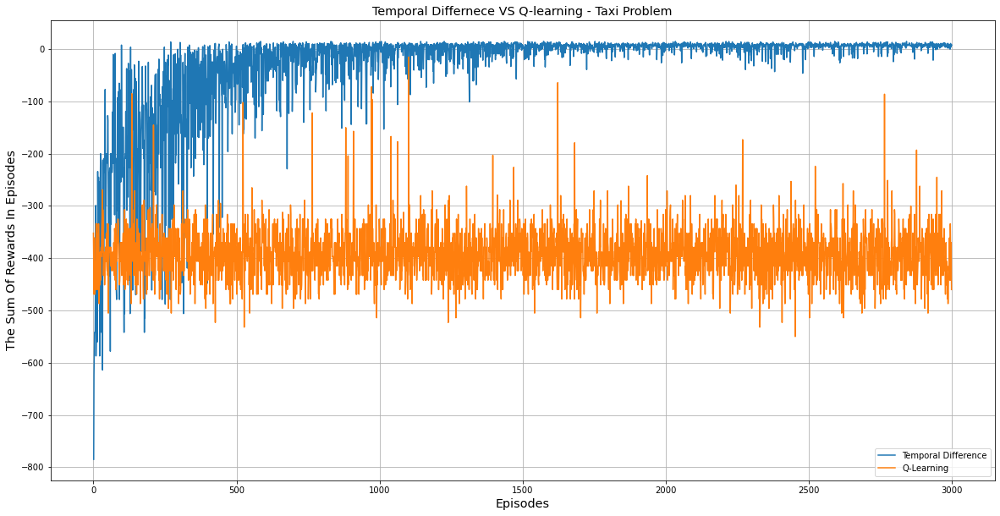

In [54]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.font_manager import FontProperties

fontP = FontProperties()
fontP.set_size('xx-large')

print(np.array(R2))
print(np.array(E2))

t = np.array(R1)              
s = np.array(E1) 
np.savetxt("Ql-taxi.csv", R1, delimiter=",")
t2 = np.array(R2)              
s2 = np.array(E2)              
np.savetxt("TD-taxi-.csv", R2, delimiter=",")
 
params = {'axes.labelsize': 'x-large',
         'axes.titlesize':'x-large',
         }
plt.rcParams.update(params)

fig, ax = plt.subplots()
p1 =ax.plot(s2, t2 ,label='Temporal Difference') 
p2 =ax.plot(s, t, label='Q-Learning') 
ax.set(xlabel='Episodes', ylabel='The Sum Of Rewards In Episodes',
       title='Temporal Differnece VS Q-learning - Taxi Problem')
ax.grid()
ax.legend()
fig.set_size_inches(20, 10)
fig.savefig('QVTpng.png', dpi=100)


plt.show()